In [ ]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
import glob
import os
import tqdm
from sklearn.model_selection import StratifiedKFold

In [ ]:
# connect to google drive
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


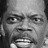

In [ ]:
# loading a sample image
sample_image = Image.open("/content/gdrive/MyDrive/Expression Dataset/Train_Relabeled_Cleaned/angry/10.jpg")
sample_image

In [ ]:
# check shape
np.array(sample_image).shape

(48, 48)

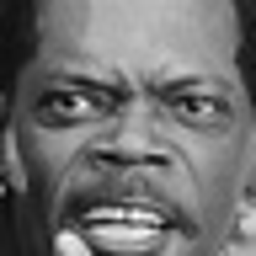

In [ ]:
# img after resize
sample_image = sample_image.resize([256,256])
sample_image

In [ ]:
# check shape
np.array(sample_image).shape

(256, 256)

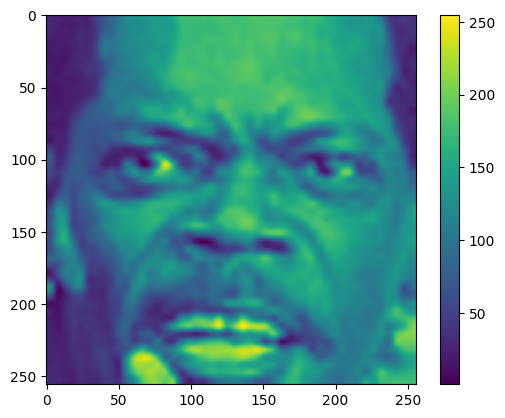

In [ ]:
# visualize image
plt.imshow(np.array(sample_image))
plt.colorbar()

## Load Data and Normalization

In [ ]:
def load_normalize(image_path, normalized=True):
    """
    Load an image file from the given file path and normalize its pixel values to the range [0, 1].

    Args:
        image_path (str): The file path of the image to be loaded.
        normalized (bool): Whether to normalize the pixel values of the image. Default is True.

    Returns:
        np.ndarray: A NumPy array representing the loaded image. If `normalized` is True, the pixel values of the image
        are normalized to the range [0, 1]. Otherwise, the pixel values are in the range [0, 255] (the original range
        of the image file).

    Raises:
        FileNotFoundError: If the specified image file does not exist.
    """
    image = Image.open(image_path).resize([128,128])
    image = np.array(image).astype(np.float32)
    if len(image.shape) == 3:
        image = image.sum(axis=2)
    if normalized:
        return image / 255.0
    else:
        return image

In [ ]:
# code to load all the data, assuming dataset is at /content/gdrive/MyDrive/Expression Dataset/Train_Relabeled_Cleaned
emo_types = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']
emo_inds = np.arange(0, len(emo_types))
x_data = []
y_data = []

for emo_ind in emo_inds:
    all_images = glob.glob(os.path.join('/content/gdrive/MyDrive/Expression Dataset/Train_Relabeled_Cleaned/', emo_types[emo_ind],'*.jpg'))
    x_data += [load_normalize(image_path) for image_path in all_images]
    y_data += [emo_ind]*len(all_images)

In [ ]:
print(f"There are {len(x_data)} in total.")

There are 27546 in total.


In [ ]:
for i,emo in enumerate(emo_types):
  print(emo,":", y_data.count(i))

angry : 3977
disgust : 551
fear : 3867
happy : 7230
neutral : 4580
sad : 4696
surprise : 2645


In [ ]:
emo_types = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']
emo_inds = np.arange(0, len(emo_types))

(22036, 128, 128, 1) (22036, 7)
(5510, 128, 128, 1) (5510, 7)


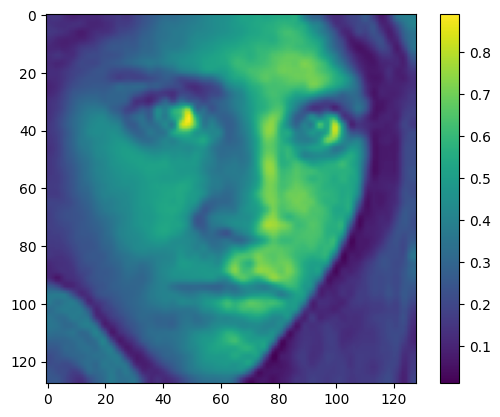

In [ ]:
# adding a fake color channel
x_data = np.array(x_data).reshape(-1, 128, 128, 1)
y_data = np.array(y_data)

folder = StratifiedKFold(5, shuffle=True)
x_indices = np.arange(0, len(x_data))
train_indices, val_indices = folder.split(x_indices, y_data).__next__()
# shuffling
np.random.shuffle(train_indices)

x_train = x_data[train_indices]
# one hot encoding
y_train = np.eye(len(emo_types))[y_data[train_indices]]

x_val = x_data[val_indices]
# one hot encoding
y_val = np.eye(len(emo_types))[y_data[val_indices]]

print(x_train.shape, y_train.shape)
print(x_val.shape, y_val.shape)

plt.imshow(x_train[0,:,:,0])
plt.colorbar()

## Base VGG16

In [ ]:
VGG16_model = tf.keras.models.Sequential([
    # Input layer
    tf.keras.layers.Input(x_train[0].shape),

    # convolutional layers:
    tf.keras.layers.Conv2D(filters=64,kernel_size=3, padding='same',activation='relu'),
    tf.keras.layers.Conv2D(filters=64,kernel_size=3, padding='same',activation='relu'),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layers:
    tf.keras.layers.Conv2D(filters=128,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.Conv2D(filters=128,kernel_size=3, padding='same', activation='relu'),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layers:
    tf.keras.layers.Conv2D(filters=256,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.Conv2D(filters=256,kernel_size=3, padding='same', activation='relu'),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layers:
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layers:
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # dense layer:
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4096, activation='relu'),
    tf.keras.layers.Dense(4096, activation='relu'),
    tf.keras.layers.Dense(1000, activation='relu'),

    # output layer:
    tf.keras.layers.Dense(7, activation='softmax')
])

In [ ]:
VGG16_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 64)      640       
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 64)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 64, 64, 128)       147584    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 128)      0         
 2D)                                                    

In [ ]:
# early stop to prevent overfitting
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
# Set up the optimizer, loss function, and metrics to monitor
VGG16_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.0001),  # pick an optimizer and learning rate
                     loss=tf.keras.losses.CategoricalCrossentropy(),  # pick a loss
                     metrics=tf.keras.metrics.CategoricalAccuracy())  # pick a metric to monitor

In [ ]:
# Fit the model
n_epoch = 30
hist = VGG16_model.fit(x_train, y_train,
              epochs=n_epoch,
              batch_size=64,
              validation_data=(x_val, y_val),
              callbacks=[callback])

Epoch 1/30
345/345 [==============================] - 114s 262ms/step - loss: 1.8183 - categorical_accuracy: 0.2608 - val_loss: 1.7960 - val_categorical_accuracy: 0.2624
Epoch 2/30
345/345 [==============================] - 85s 246ms/step - loss: 1.7386 - categorical_accuracy: 0.2937 - val_loss: 1.5550 - val_categorical_accuracy: 0.3917
Epoch 3/30
345/345 [==============================] - 80s 232ms/step - loss: 1.4475 - categorical_accuracy: 0.4351 - val_loss: 1.3437 - val_categorical_accuracy: 0.4760
Epoch 4/30
345/345 [==============================] - 85s 247ms/step - loss: 1.2747 - categorical_accuracy: 0.5093 - val_loss: 1.2438 - val_categorical_accuracy: 0.5254
Epoch 5/30
345/345 [==============================] - 80s 233ms/step - loss: 1.1296 - categorical_accuracy: 0.5713 - val_loss: 1.1915 - val_categorical_accuracy: 0.5497
Epoch 6/30
345/345 [==============================] - 81s 234ms/step - loss: 0.9788 - categorical_accuracy: 0.6315 - val_loss: 1.1392 - val_categorical_ac

In [ ]:
# Save final number of epoch
n_epoch = 9

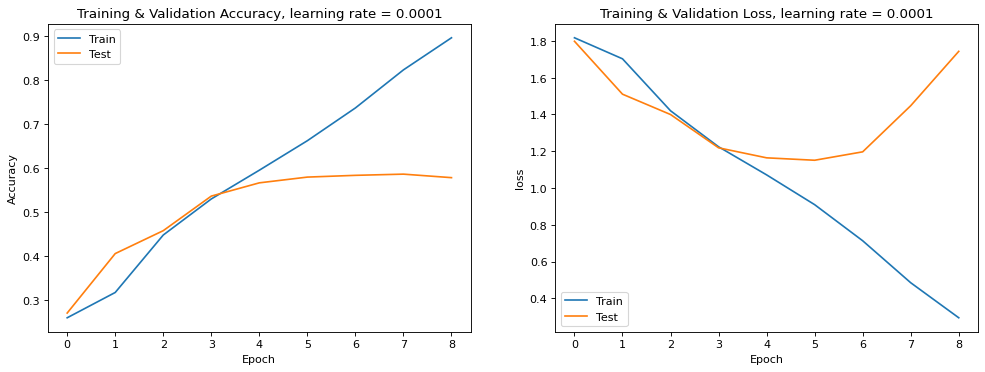

In [ ]:
# Plotting the training and validation accuracy and loss
plt.figure(figsize=(15, 5), dpi=80)
plt.subplot(1, 2, 1) # row 1, col 2 index 1
plt.plot(np.arange(n_epoch),hist.history.get('categorical_accuracy'), label="Train")
plt.plot(np.arange(n_epoch),hist.history.get('val_categorical_accuracy'), label="Test")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(loc='best')
plt.title("Training & Validation Accuracy, learning rate = 0.0001")

plt.subplot(1, 2, 2) # index 2
plt.plot(np.arange(n_epoch),hist.history.get('loss'), label="Train")
plt.plot(np.arange(n_epoch),hist.history.get('val_loss'), label="Test")
plt.xlabel("Epoch")
plt.ylabel("loss")
plt.legend(loc='best')
plt.title("Training & Validation Loss, learning rate = 0.0001")
plt.show()

In [ ]:
# Save the weights
VGG16_model.save_weights('/content/gdrive/MyDrive/Colab Notebooks/Machine Learning/VGG16_modelVGG16_model')

In [ ]:
# load the weights
VGG16_model.load_weights('/content/gdrive/MyDrive/Colab Notebooks/Machine Learning/VGG16_model')

### Test Model

In [ ]:
# code to load all the test data

for emo_ind in emo_inds:
    all_images = glob.glob(os.path.join('/content/gdrive/MyDrive/Expression Dataset/Validation_Relabeled_Cleaned', emo_types[emo_ind],'*.jpg'))
    x_test += [load_normalize(image_path) for image_path in all_images]
    y_test += [emo_ind]*len(all_images)

In [ ]:
print(f"There are {len(x_test)} in total.")
for i,emo in enumerate(emo_types):
  print(emo,":", y_test.count(i))

There are 6488 in total.
angry : 888
disgust : 83
fear : 916
happy : 1752
neutral : 1181
sad : 1088
surprise : 580


(6488, 128, 128, 1) (6488, 7)


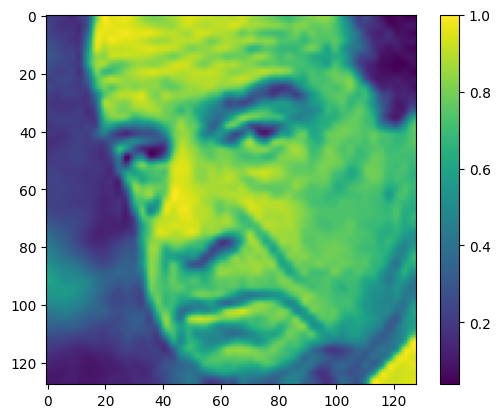

In [ ]:
# adding a fake color channel
x_test = np.array(x_test).reshape(-1, 128, 128, 1)
y_test = np.array(y_test)

# one hot encoding
y_test = np.eye(len(emo_types))[y_test]

print(x_test.shape, y_test.shape)

plt.imshow(x_test[0,:,:,0])
plt.colorbar()

In [ ]:
# Evaluate the model
loss, acc = VGG16_model.evaluate(x_test, y_test, verbose=2)
print("VGG 16 model, accuracy: {:5.2f}%".format(100 * acc))

203/203 - 10s - loss: 1.6656 - categorical_accuracy: 0.5641 - 10s/epoch - 50ms/step
VGG 16 model, accuracy: 56.41%


In [ ]:
print(f"VGG 16 model, loss: {loss:.2f}")

VGG 16 model, loss: 1.67


In [ ]:
# Predict test data
y_pred = VGG16_model.predict(x_test, verbose=2)

203/203 - 7s - 7s/epoch - 32ms/step


In [ ]:
# Defining the class from the predicted values
y_pred = np.argmax(y_pred,axis = 1)

In [ ]:
# Defining the class from the actual values
y_test = np.argmax(y_test,axis = 1)

In [ ]:
# load metrics library
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix, classification_report

In [ ]:
print(classification_report(y_test,y_pred,digits=5))
matrix = confusion_matrix(y_test,y_pred)
matrix.diagonal()/matrix.sum(axis=1)

              precision    recall  f1-score   support

           0    0.49339   0.42005   0.45377       888
           1    0.31915   0.36145   0.33898        83
           2    0.36775   0.40830   0.38696       916
           3    0.77409   0.82534   0.79890      1752
           4    0.52668   0.50974   0.51807      1181
           5    0.44576   0.44945   0.44760      1088
           6    0.67446   0.59655   0.63312       580

    accuracy                        0.56412      6488
   macro avg    0.51447   0.51012   0.51106      6488
weighted avg    0.56348   0.56412   0.56277      6488



In [ ]:
# accuracy per class
matrix = confusion_matrix(y_test,y_pred)
matrix.diagonal()/matrix.sum(axis=1)

array([0.42004505, 0.36144578, 0.40829694, 0.82534247, 0.50973751,
       0.44944853, 0.59655172])

Seems overfitted. Next step is try to reduce overfitting.

## Batch Normalisation and Drop Out

In [ ]:
VGG16_model_bn = tf.keras.models.Sequential([
    
    # Input layer
    tf.keras.layers.Input(x_train[0].shape),

    # convolutional layer with batch normalisation:
    tf.keras.layers.Conv2D(filters=64,kernel_size=3, padding='same',activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=64,kernel_size=3, padding='same',activation='relu'),
    tf.keras.layers.BatchNormalization(),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layer with batch normalisation:
    tf.keras.layers.Conv2D(filters=128,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=128,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layer with batch normalisation:
    tf.keras.layers.Conv2D(filters=256,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=256,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layer with batch normalisation:
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layer with batch normalisation:
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # dense layer:
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4096, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(4096, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(1000, activation='relu'),
    tf.keras.layers.Dropout(0.3),

    # Batch Normalisation layer:
    tf.keras.layers.BatchNormalization(),


    # output layer:
    tf.keras.layers.Dense(7, activation='softmax')
])

In [ ]:
# compile the model
VGG16_model_bn.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.0001),  # pick an optimizer and learning rate
                     loss=tf.keras.losses.CategoricalCrossentropy(),  # pick a loss
                     metrics=tf.keras.metrics.CategoricalAccuracy())  # pick a metric to monitor

In [ ]:
# fit the model
n_epoch = 30
hist = VGG16_model_bn.fit(x_train, y_train,
              epochs=n_epoch,
              batch_size=32,
              validation_data=(x_val, y_val),
              callbacks=[callback])

Epoch 1/30
689/689 [==============================] - 112s 152ms/step - loss: 1.9995 - categorical_accuracy: 0.2967 - val_loss: 1.7099 - val_categorical_accuracy: 0.3365
Epoch 2/30
689/689 [==============================] - 104s 151ms/step - loss: 1.5659 - categorical_accuracy: 0.4227 - val_loss: 1.2998 - val_categorical_accuracy: 0.4895
Epoch 3/30
689/689 [==============================] - 104s 151ms/step - loss: 1.2972 - categorical_accuracy: 0.5136 - val_loss: 1.2421 - val_categorical_accuracy: 0.5307
Epoch 4/30
689/689 [==============================] - 104s 151ms/step - loss: 1.1496 - categorical_accuracy: 0.5704 - val_loss: 1.2021 - val_categorical_accuracy: 0.5528
Epoch 5/30
689/689 [==============================] - 104s 151ms/step - loss: 1.0357 - categorical_accuracy: 0.6187 - val_loss: 1.1594 - val_categorical_accuracy: 0.5721
Epoch 6/30
689/689 [==============================] - 104s 151ms/step - loss: 0.9321 - categorical_accuracy: 0.6566 - val_loss: 1.1199 - val_categoric

In [ ]:
# save the final epoch
n_epoch=9

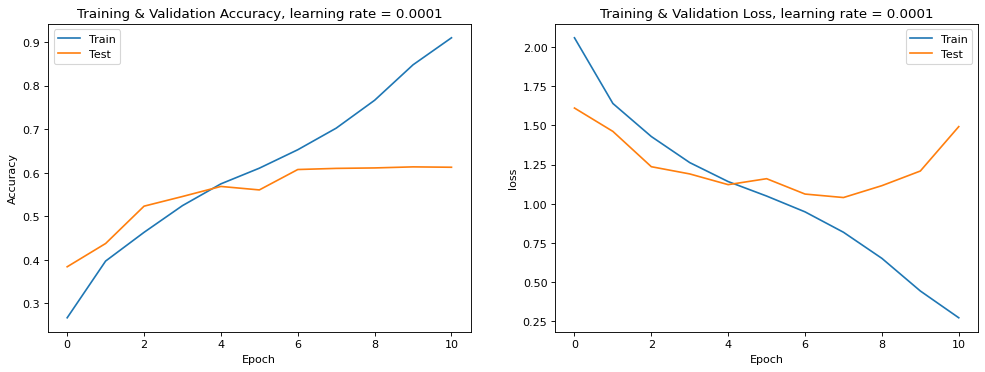

In [ ]:
# plot the training and validation accuracy and loss
plt.figure(figsize=(15, 5), dpi=80)
plt.subplot(1, 2, 1) # row 1, col 2 index 1
plt.plot(np.arange(n_epoch),hist.history.get('categorical_accuracy'), label="Train")
plt.plot(np.arange(n_epoch),hist.history.get('val_categorical_accuracy'), label="Test")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(loc='best')
plt.title("Training & Validation Accuracy, learning rate = 0.0001")

plt.subplot(1, 2, 2) # index 2
plt.plot(np.arange(n_epoch),hist.history.get('loss'), label="Train")
plt.plot(np.arange(n_epoch),hist.history.get('val_loss'), label="Test")
plt.xlabel("Epoch")
plt.ylabel("loss")
plt.legend(loc='best')
plt.title("Training & Validation Loss, learning rate = 0.0001")
plt.show()

In [ ]:
# Save the weights
VGG16_model_bn.save_weights('/content/gdrive/MyDrive/Colab Notebooks/Machine Learning/VGG16_model_bn')

In [ ]:
# load the weights
VGG16_model_bn.load_weights('/content/gdrive/MyDrive/Colab Notebooks/Machine Learning/VGG16_model_bn')

In [ ]:
# one hot encoding
y_test = np.eye(len(emo_types))[y_test]

In [ ]:
# Evaluate the model
loss, acc = VGG16_model_bn.evaluate(x_test, y_test, verbose=2)
print("VGG 16 model, accuracy: {:5.2f}%".format(100 * acc))

In [ ]:
# Predict the test set
y_pred = VGG16_model_bn.predict(x_test, verbose=2)

203/203 - 8s - 8s/epoch - 38ms/step


In [ ]:
# define the class labels
y_pred = np.argmax(y_pred,axis = 1)

In [ ]:
# Check the class label
y_test

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [ ]:
# define the class labels
y_test = np.argmax(y_test,axis = 1)

In [ ]:
# accuracy by class
matrix.diagonal()/matrix.sum(axis=1)

array([0.55518018, 0.21686747, 0.42139738, 0.79737443, 0.51989839,
       0.44393382, 0.66896552])

In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.47      0.56      0.51       888
           1       0.62      0.22      0.32        83
           2       0.37      0.42      0.39       916
           3       0.85      0.80      0.82      1752
           4       0.58      0.52      0.55      1181
           5       0.45      0.44      0.45      1088
           6       0.68      0.67      0.68       580

    accuracy                           0.58      6488
   macro avg       0.57      0.52      0.53      6488
weighted avg       0.59      0.58      0.59      6488



## Hyper Parameter Tuning
- Learning rate
- Drop Out

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

# Clear any logs from previous runs
%rm -rf ./logs/

In [ ]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp

In [ ]:
# define the potential hyperparameters
HP_LR = hp.HParam('learning_rate', hp.Discrete([1e-4, 5e-4, 1e-3]))
HP_DROPOUT = hp.HParam('dropout', hp.Discrete([0.05,0.1,0.2,0.3]))

METRIC_ACCURACY = 'categorical_accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_LR, HP_DROPOUT],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='categorical_accuracy')],
  )

In [ ]:
# make a function to change the hyperparameters
def train_test_model(hparams):
    VGG16_model_bn = tf.keras.models.Sequential([
      
      # Input layer
      tf.keras.layers.Input(x_train[0].shape),

      # convolutional layer with batch normalisation:
      tf.keras.layers.Conv2D(filters=64,kernel_size=3, padding='same',activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(filters=64,kernel_size=3, padding='same',activation='relu'),
      tf.keras.layers.BatchNormalization(),

      #Max pooling layer:
      tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

      # convolutional layer with batch normalisation:
      tf.keras.layers.Conv2D(filters=128,kernel_size=3, padding='same', activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(filters=128,kernel_size=3, padding='same', activation='relu'),
      tf.keras.layers.BatchNormalization(),

      #Max pooling layer:
      tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

      # convolutional layer with batch normalisation:
      tf.keras.layers.Conv2D(filters=256,kernel_size=3, padding='same', activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(filters=256,kernel_size=3, padding='same', activation='relu'),
      tf.keras.layers.BatchNormalization(),

      #Max pooling layer:
      tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

      # convolutional layer with batch normalisation:
      tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
      tf.keras.layers.BatchNormalization(),

      #Max pooling layer:
      tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

      # convolutional layer with batch normalisation:
      tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
      tf.keras.layers.BatchNormalization(),

      #Max pooling layer:
      tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

      # dense layer:
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(4096, activation='relu'),
      tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
      tf.keras.layers.Dense(4096, activation='relu'),
      tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
      tf.keras.layers.Dense(1000, activation='relu'),
      tf.keras.layers.Dropout(hparams[HP_DROPOUT]),

      # Batch Normalisation layer:
      tf.keras.layers.BatchNormalization(),


      # output layer:
      tf.keras.layers.Dense(7, activation='softmax')
  ])
    VGG16_model_bn.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = hparams[HP_LR]),  # pick an optimizer and learning rate
                      loss=tf.keras.losses.CategoricalCrossentropy(),  # pick a loss
                      metrics=tf.keras.metrics.CategoricalAccuracy())  # pick a metric to monitor
    VGG16_model_bn.fit(x_train, y_train,
                  epochs=30,
                  batch_size=32,
                  validation_data=(x_val, y_val),
                  callbacks=[
          tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5,restore_best_weights=True),
          tf.keras.callbacks.TensorBoard('logs/hparam_tuning'),  # log metrics
          hp.KerasCallback('logs/hparam_tuning', hparams),  # log hparams
      ])
    _, accuracy = VGG16_model_bn.evaluate(x_val, y_val)
    return accuracy

In [ ]:
# make a function to run the model with different hyperparameters
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)

In [ ]:
# run the grid search
session_num = 0

for learning_rate in HP_LR.domain.values:
  for dropout_rate in HP_DROPOUT.domain.values:
    hparams = {
        HP_LR: learning_rate,
        HP_DROPOUT: dropout_rate,
    }
    run_name = "run-%d" % session_num
    print('--- Starting trial: %s' % run_name)
    print({h.name: hparams[h] for h in hparams})
    run('logs/hparam_tuning/' + run_name, hparams)
    session_num += 1

--- Starting trial: run-0
{'learning_rate': 0.0001, 'dropout': 0.05}
Epoch 1/30
689/689 [==============================] - 129s 154ms/step - loss: 1.6397 - categorical_accuracy: 0.3960 - val_loss: 1.8029 - val_categorical_accuracy: 0.3555
Epoch 2/30
689/689 [==============================] - 101s 147ms/step - loss: 1.2829 - categorical_accuracy: 0.5253 - val_loss: 1.3584 - val_categorical_accuracy: 0.5156
Epoch 3/30
689/689 [==============================] - 101s 147ms/step - loss: 1.1346 - categorical_accuracy: 0.5785 - val_loss: 1.4483 - val_categorical_accuracy: 0.5318
Epoch 4/30
689/689 [==============================] - 102s 148ms/step - loss: 1.0119 - categorical_accuracy: 0.6295 - val_loss: 1.2035 - val_categorical_accuracy: 0.5730
Epoch 5/30
689/689 [==============================] - 102s 148ms/step - loss: 0.8715 - categorical_accuracy: 0.6825 - val_loss: 1.1919 - val_categorical_accuracy: 0.5784
Epoch 6/30
689/689 [==============================] - 101s 147ms/step - loss: 0.7

In [ ]:
%tensorboard --logdir logs/hparam_tuning

Output hidden; open in https://colab.research.google.com to view.

## Baseline Final Model
- Learning rate = 0.0005
- Dropout = 0.3

In [ ]:
# define the model
VGG16_model_final = tf.keras.models.Sequential([
    
    # Input layer
    tf.keras.layers.Input(x_train[0].shape),

    # convolutional layer with batch normalisation:
    tf.keras.layers.Conv2D(filters=64,kernel_size=3, padding='same',activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=64,kernel_size=3, padding='same',activation='relu'),
    tf.keras.layers.BatchNormalization(),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layer with batch normalisation:
    tf.keras.layers.Conv2D(filters=128,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=128,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layer with batch normalisation:
    tf.keras.layers.Conv2D(filters=256,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=256,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layer with batch normalisation:
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # convolutional layer with batch normalisation:
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=512,kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),

    #Max pooling layer:
    tf.keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same'),

    # dense layer:
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4096, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(4096, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(1000, activation='relu'),
    tf.keras.layers.Dropout(0.3),

    # Batch Normalisation layer:
    tf.keras.layers.BatchNormalization(),


    # output layer:
    tf.keras.layers.Dense(7, activation='softmax')
])

In [ ]:
# compile the model
VGG16_model_final.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.0005),  # pick an optimizer and learning rate
                     loss=tf.keras.losses.CategoricalCrossentropy(),  # pick a loss
                     metrics=tf.keras.metrics.CategoricalAccuracy())  # pick a metric to monitor

In [ ]:
# load test data
x_test = []
y_test = []

for emo_ind in emo_inds:
    all_images = glob.glob(os.path.join('/content/gdrive/MyDrive/Expression Dataset/Validation_Relabeled_Cleaned', emo_types[emo_ind],'*.jpg'))
    # x_data += [load_extract_normalize(image_path) for image_path in all_images]
    x_test += [load_normalize(image_path) for image_path in all_images]
    y_test += [emo_ind]*len(all_images)

(6488, 128, 128, 1) (6488, 7)


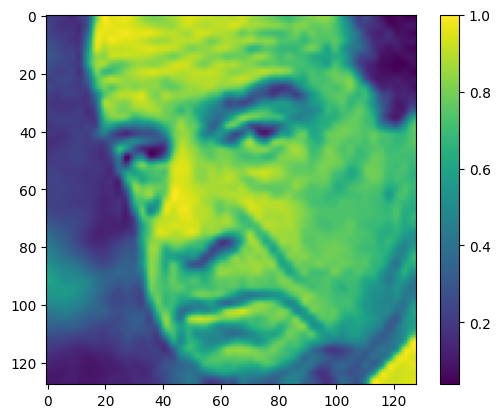

In [ ]:
# adding a fake color channel
x_test = np.array(x_test).reshape(-1, 128, 128, 1)
y_test = np.array(y_test)

y_test = np.eye(len(emo_types))[y_test]

print(x_test.shape, y_test.shape)

plt.imshow(x_test[0,:,:,0])
plt.colorbar()

(27546, 128, 128, 1) (27546, 7)


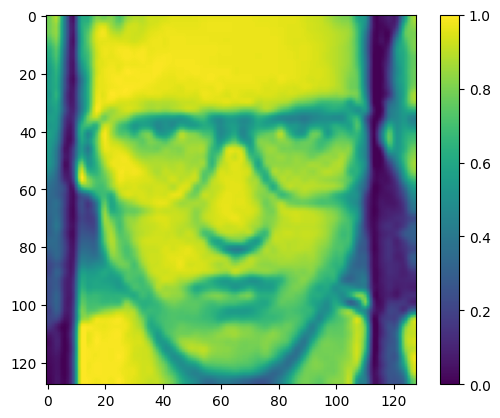

In [ ]:
# load the whole training data
y_data = np.eye(len(emo_types))[y_data]

print(x_data.shape, y_data.shape)

plt.imshow(x_data[0,:,:,0])
plt.colorbar()

In [ ]:
# fit the model
n_epoch = 30
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5,restore_best_weights=True)
hist = VGG16_model_final.fit(x_data, y_data,
              epochs=n_epoch,
              batch_size=32,
              validation_data=(x_test, y_test),
              callbacks=[callback])

Epoch 1/30
861/861 [==============================] - 137s 150ms/step - loss: 1.9573 - categorical_accuracy: 0.2479 - val_loss: 1.6725 - val_categorical_accuracy: 0.3354
Epoch 2/30
861/861 [==============================] - 126s 147ms/step - loss: 1.5948 - categorical_accuracy: 0.3869 - val_loss: 1.7852 - val_categorical_accuracy: 0.3554
Epoch 3/30
861/861 [==============================] - 127s 147ms/step - loss: 1.4171 - categorical_accuracy: 0.4545 - val_loss: 1.7079 - val_categorical_accuracy: 0.3217
Epoch 4/30
861/861 [==============================] - 126s 147ms/step - loss: 1.3005 - categorical_accuracy: 0.4980 - val_loss: 1.2696 - val_categorical_accuracy: 0.5247
Epoch 5/30
861/861 [==============================] - 126s 147ms/step - loss: 1.1483 - categorical_accuracy: 0.5674 - val_loss: 1.2014 - val_categorical_accuracy: 0.5544
Epoch 6/30
861/861 [==============================] - 126s 147ms/step - loss: 1.1364 - categorical_accuracy: 0.5729 - val_loss: 1.1846 - val_categoric

In [ ]:
# Save the weights
VGG16_model_final.save_weights('/content/gdrive/MyDrive/Colab Notebooks/Machine Learning/VGG16_model_final')

In [ ]:
# Evaluate the model
loss, acc = VGG16_model_final.evaluate(x_test, y_test, verbose=2)
print("VGG 16 model, accuracy: {:5.2f}%".format(100 * acc))

203/203 - 8s - loss: 1.1007 - categorical_accuracy: 0.6107 - 8s/epoch - 37ms/step
VGG 16 model, accuracy: 61.07%


In [ ]:
# predict the test data
y_pred = VGG16_model_final.predict(x_test, verbose=2)

203/203 - 8s - 8s/epoch - 37ms/step


In [ ]:
# define the class labels
y_pred = np.argmax(y_pred,axis = 1)

In [ ]:
# define the class labels
y_test = np.argmax(y_test,axis = 1)

In [ ]:
print(classification_report(y_test,y_pred,digits=5))
matrix = confusion_matrix(y_test,y_pred)

              precision    recall  f1-score   support

           0    0.49390   0.59234   0.53866       888
           1    0.40506   0.38554   0.39506        83
           2    0.49191   0.33188   0.39635       916
           3    0.89210   0.79281   0.83953      1752
           4    0.59753   0.57324   0.58513      1181
           5    0.49357   0.52941   0.51086      1088
           6    0.52704   0.78966   0.63216       580

    accuracy                        0.61067      6488
   macro avg    0.55730   0.57070   0.55682      6488
weighted avg    0.62178   0.61067   0.61013      6488



In [ ]:
# accuracy by class
matrix.diagonal()/matrix.sum(axis=1)

array([0.59234234, 0.38554217, 0.33187773, 0.79280822, 0.57324301,
       0.52941176, 0.78965517])